## Transportation Safety Board (TSB) Air transportation occurrence data

#### Definitions

<ul>
<li>Aircraft: airplane, helicopter, or other machine capable of flight (glider, balloon, UAS)</li>
<li>Accident: serious injury or fatality</li>
<li>Incident: &lsquo;damaged&rsquo; aircraft</li>
<li>Jurisdiction: CND reg, built aircraft or req by country</li>
</ul>
<h4 id="Full-definition-of-contents--http://www.tsb.gc.ca/eng/stats/aviation/2016/ssea-ssao-2016.html">Full definition of contents&nbsp;<a href="http://www.tsb.gc.ca/eng/stats/aviation/2016/ssea-ssao-2016.html" target="_blank" rel="noopener">http://www.tsb.gc.ca/eng/stats/aviation/2016/ssea-ssao-2016.html</a></h4>


#### Main Objectives

<ul>
<li>Occurrence (accidents or incidents) predictions from public data</li>
<li>Relevant features associated with the events</li>
<li>Data patterns and observations (occurrences&rsquo; location, distribution, number of incidents related to accidents)</li>
</ul>
</li>
</ul>


#### Datasets description

<ul>
<li>Five csv files updated &ldquo;monthly&rdquo; (Occ, Acf, Inj, Pha, Surv), 1976-2019</li>
<li>One csv file with movements for all airports (Canada Statistics), 1997-2018</li>
</ul>

#### Based on the OSEMN framework, following are the five project lifecycle steps

### 1. Obtain Data (Collect data and read it)

In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [116]:
#Read datasets, no description available. ALl files available at 
# http://www.tsb.gc.ca/eng/stats/aviation/data-5.html. Adding conditions as warning
# received: Columns (+30 in total)have mixed types. Specify dtype option on 
# import or set low_memory=False.
#movements source: https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=2310001801


df1 = pd.read_csv('ASISdb_MDOTW_VW_OCCURRENCE_PUBLIC.csv') 
#                   sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df2 = pd.read_csv('ASISdb_MDOTW_VW_AIRCRAFT_PUBLIC.csv')
#                  sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df3 = pd.read_csv('ASISdb_MDOTW_VW_EVENTS_AND_PHASES_PUBLIC.csv')
#df4 = pd.read_csv('ASISdb_MDOTW_VW_SURVIVABILITY_PUBLIC.csv')
dfo = pd.read_csv('23100018.csv')


In [117]:
df1.shape

(47226, 246)

In [118]:
df2.shape

(57227, 194)

In [119]:
df3.shape

(105506, 14)

In [120]:
df1.head()

,OccID,OccNo,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,InitialPositionEnum_DisplayFre,FinalPositionEnum,FinalPositionEnum_DisplayEng,FinalPositionEnum_DisplayFre,FullProcedureIND,FullProcedureIND_DisplayEng,FullProcedureIND_DisplayFre,SurfaceContaminationID,SurfaceContaminationID_DisplayEng,SurfaceContaminationID_DisplayFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,152825,A19P0069,1912.0,Vancouver Intl,2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 2. Scrub Data ("Clean", filter, prepare for merging) 

In [121]:
df1u = df1.OccID.nunique()

In [122]:
#Rename occid
df2 = df2.rename(index=str, columns={"occid": "OccID"})

In [123]:
df2u = df2.OccID.nunique()

In [124]:
df3u = df3.OccID.nunique()

In [125]:
unique_ = pd.DataFrame({'Dataset' :["AC","EVE", "PHA"],#"OCC","SUR"], 
                        "Unique":[df1u,df2u, df3u]})
unique_.sort_values(by="Unique", ascending=False)

,Dataset,Unique
0,AC,43855
1,EVE,43854
2,PHA,43814


#### Merging the three datasets with relevant information

In [126]:
from functools import reduce
dfs = [df1,df2,df3]
dfm = reduce(lambda left,right: pd.merge(left,right, on='OccID'), dfs)

In [127]:
dfm

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
5,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
6,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
7,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
8,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
9,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA

### 3. Explore Data

In [128]:
dfm.shape

(181464, 452)

In [129]:
dfm.head()

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...


In [130]:
# Drop duplicates

dfm = dfm.sort_values("OccID", ascending=True)
dfm = dfm.drop_duplicates(subset ="OccID") 
#df.dropna(inplace = True)

In [131]:
dfm.shape

(43814, 452)

In [132]:
dfm.isnull().sum()
#dropped the nulls and update the dataframe
# dfm.shape

OccID                                      0
OccNo_x                                    0
AirportID                              26500
AirportID_AirportName                  26500
AirportID_CountryID                    26500
AirportID_CountryID_DisplayEng         26500
AirportID_CountryID_DisplayFre         26500
Airport_ProvinceID                     26920
AirportID_ProvinceID_DisplayEng        26920
AirportID_ProvinceID_DisplayFre        26920
Location                               26500
Latitude                                1330
LatEnum                                 1332
LatEnum_DisplayEng                      1332
LatEnum_DisplayFre                      1332
Longitude                               1326
LongEnum                                1517
LongEnum_DisplayEng                     1517
LongEnum_DisplayFre                     1517
ICAO                                   26500
BearingID                              41378
BearingID_Abbr                         41378
BearingID_

In [133]:
dfm.shape

(43814, 452)

In [134]:
dfm.dtypes

OccID                                    int64
OccNo_x                                 object
AirportID                              float64
AirportID_AirportName                   object
AirportID_CountryID                    float64
AirportID_CountryID_DisplayEng          object
AirportID_CountryID_DisplayFre          object
Airport_ProvinceID                     float64
AirportID_ProvinceID_DisplayEng         object
AirportID_ProvinceID_DisplayFre         object
Location                                object
Latitude                               float64
LatEnum                                float64
LatEnum_DisplayEng                      object
LatEnum_DisplayFre                      object
Longitude                              float64
LongEnum                               float64
LongEnum_DisplayEng                     object
LongEnum_DisplayFre                     object
ICAO                                    object
BearingID                              float64
BearingID_Abb

In [135]:
dfm.columns

Index(['OccID', 'OccNo_x', 'AirportID', 'AirportID_AirportName',
       'AirportID_CountryID', 'AirportID_CountryID_DisplayEng',
       'AirportID_CountryID_DisplayFre', 'Airport_ProvinceID',
       'AirportID_ProvinceID_DisplayEng', 'AirportID_ProvinceID_DisplayFre',
       ...
       'EventPhaseSequence', 'EventID_DisplayEng', 'EventID_DisplayFre',
       'FullEventDescEng', 'FullEventDescFre', 'PhaseID', 'PhaseID_DisplayEng',
       'PhaseID_DisplayFre', 'FullPhaseDescEng', 'FullPhaseDescFre'],
      dtype='object', length=452)

#### Visualization

In [136]:
#importing libraries in offline mode
import plotly as py
import cufflinks as cf
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.offline
import plotly_express as px
import matplotlib.pyplot as plt
import descartes
import seaborn as sns
from plotly.offline import download_plotlyjs
from plotly.offline import init_notebook_mode
from plotly.offline import plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

In [137]:
dfm.OccDate

181463     1/9/1976 12:00:00 AM
181461    1/19/1976 12:00:00 AM
181460    2/13/1976 12:00:00 AM
181455    2/16/1976 12:00:00 AM
181453    2/25/1976 12:00:00 AM
181450     3/4/1976 12:00:00 AM
181448     5/5/1976 12:00:00 AM
181446    5/29/1976 12:00:00 AM
181444     6/4/1976 12:00:00 AM
181443     6/5/1976 12:00:00 AM
181442     6/6/1976 12:00:00 AM
181441     6/5/1976 12:00:00 AM
181440    5/24/1976 12:00:00 AM
181438    6/19/1976 12:00:00 AM
181437    6/27/1976 12:00:00 AM
181435    7/18/1976 12:00:00 AM
181434    7/19/1976 12:00:00 AM
181431    7/22/1976 12:00:00 AM
181430    7/29/1976 12:00:00 AM
181429    7/31/1976 12:00:00 AM
181428     8/8/1976 12:00:00 AM
181427    8/12/1976 12:00:00 AM
181426    8/13/1976 12:00:00 AM
181424    8/16/1976 12:00:00 AM
181423    8/22/1976 12:00:00 AM
181421    9/13/1976 12:00:00 AM
181420    9/14/1976 12:00:00 AM
181419    9/18/1976 12:00:00 AM
181417    9/19/1976 12:00:00 AM
181415    9/23/1976 12:00:00 AM
                  ...          
160     

In [225]:
# Accidents, incidents proportion

dfm.OccTypeID_DisplayEng.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per type')

In [139]:
#Casting OccDate as string for visualization

dfm['OccDate'] = dfm['OccDate'].astype(str)

In [140]:
#Encoding to datetime format

dfm['OccDate'] = pd.to_datetime(dfm['OccDate'])

In [141]:
dfm.shape

(43814, 452)

In [224]:
#Ocurrences (Accidents and incidents) per year

dfm.OccDate.dt.year.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per year')

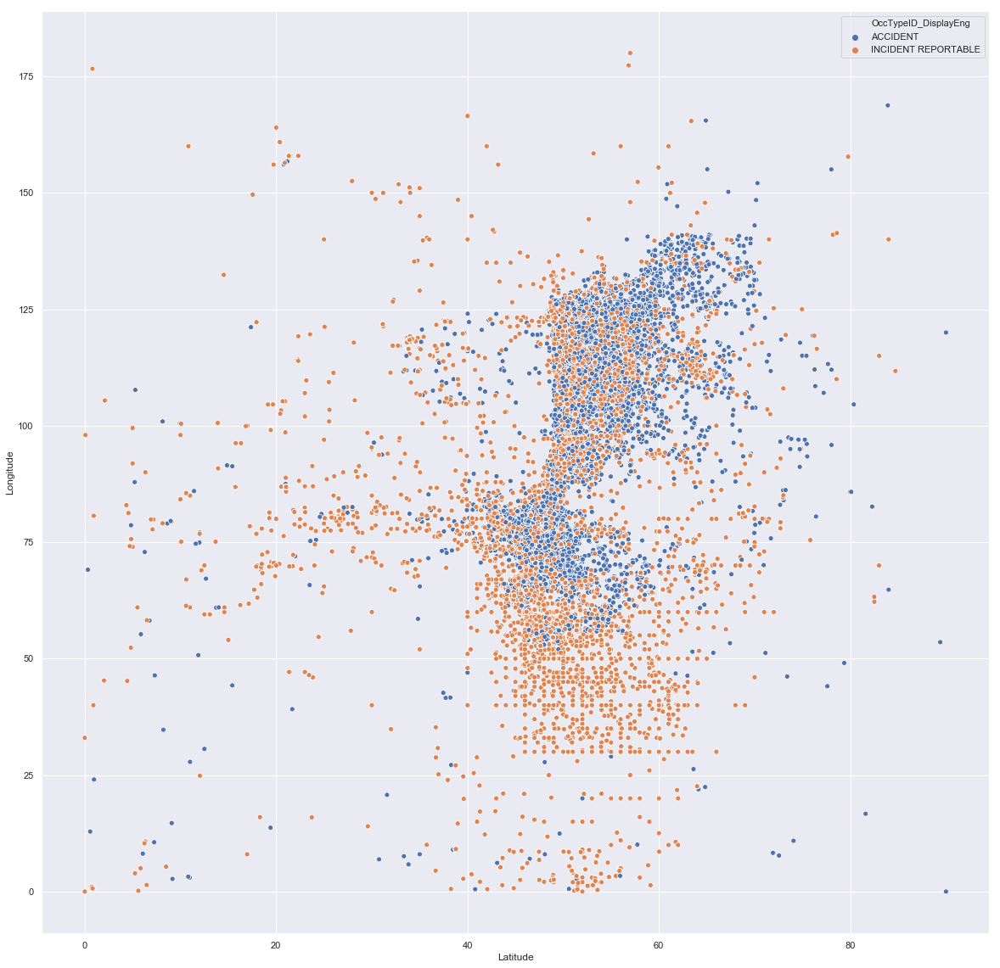

In [223]:
#Lat-Lon 'map'

sns.set(rc={'figure.figsize':(20,20)})
ax = sns.scatterplot(x='Latitude', y= 'Longitude', hue = 'OccTypeID_DisplayEng', data=dfm)


In [144]:
#Occurrences per type of operator

px.histogram(dfm, x='OperatorTypeID_DisplayEng', color='OccTypeID_DisplayEng',template='plotly')

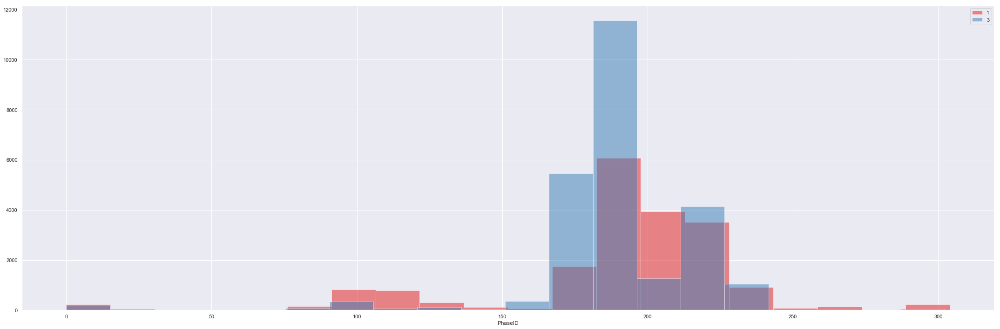

In [222]:
#Occurrence (1 : accident, 3 : incident) distribution for different phases

g = sns.FacetGrid(dfm,hue='OccTypeID',palette='Set1',height=10,aspect=3)
g = g.map(plt.hist,'PhaseID',bins=20,alpha=0.5)
plt.legend()

In [145]:
#Filling PhaseID feature's 'blanks' with 0

dfm.PhaseID.fillna(0, inplace=True)

In [146]:
#Checking results

dfm.PhaseID.isna().sum()

0

In [147]:
#Casting PhaseID_DisplayEng as string for visualization

dfm.PhaseID_DisplayEng=dfm.PhaseID_DisplayEng.astype("str")

1


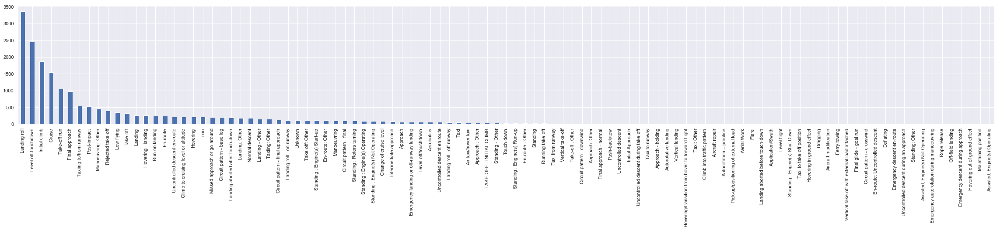

3


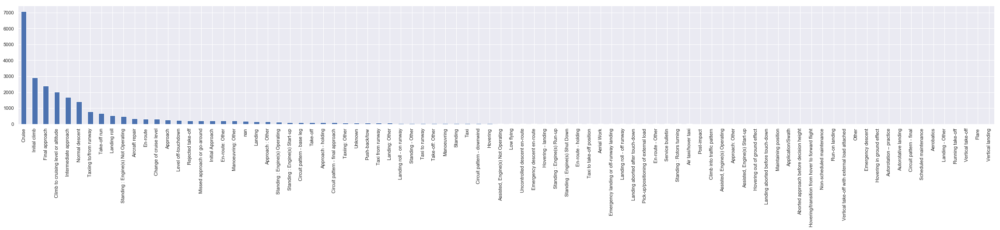

In [216]:
#Group by Occurrence type to identify phases with more accidents (1) and incidents (3)
temp=dfm[['PhaseID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(i)
    v["PhaseID_DisplayEng"].value_counts().plot.bar(figsize=(40,5))
    plt.show()

In [149]:
#Group by EventID to find occurrences' distribution for accidents

temp=dfm[['EventID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(v["EventID_DisplayEng"].value_counts())
    #v["EventID_DisplayEng"].value_counts().plot.bar(figsize=(20,200))
    #plt.show()

Aircraft collision - level terrain                      2058
Aeroplane flight path deviation                         1230
Collision aircraft-tree / tall vegetation               1072
Hard landing                                             946
POWER LOSS - FIRST ENGINE                                868
Main landing gear                                        821
Aeroplane - mush/stall                                   777
Nose gear collapsed/retracted                            488
Nosed down/overturned                                    465
Aircraft collision - high terrain                        446
Landing gear                                             425
Aircraft overrun                                         421
Fire                                                     411
Collision aircraft - cable/wire/powerline                382
Aircraft - collisions with obstacle/terrain/aircraft     373
Collision aircraft-other object                          303
Aeroplane - deviation fr

In [150]:
#Group by EventID to find occurrences' distribution for incidents

v["EventID_DisplayEng"].value_counts()

Declared Emergency/Priority/ARFF Standby            4138
Diversion - technical reasons                       1617
Separation provision                                1234
INTENTIONAL SHUTDOWN                                 731
POWER LOSS - FIRST ENGINE                            709
Loss of separation: potential collision              666
Smoke                                                663
Hydraulic system                                     522
Flight crew incapacitation/illness/medical issue     515
Landing gear                                         514
Electrical power system                              506
Aircraft - near collisions/loss of separation        460
Aircraft flight control                              435
Loss of separation: risk undetermined                421
Powerplant package                                   418
Aircraft collision - level terrain                   393
Loss of separation: no risk of collision             373
Air Navigation Services        

In [152]:
#Total fatalities per organization 

px.scatter(dfm, x='TotalFatalCount', y="OrganizationID_DisplayEng", size='TotalFatalCount', size_max=50)
#Get another graph for <100 fatalities

In [153]:
#Total fatalities per Aircraft Maker

px.scatter(dfm, x="AircraftMakeID_DisplayEng", y="TotalFatalCount", size='TotalFatalCount', size_max=60)

### 4. Model Data

In [154]:
# need features that can be used to predict an incident/accident before it actually happens
#thus, can not have features like fatality, damagelevelID etc.
features=['AircraftTypeID','AircraftMakeID','OrganizationID', 'OperationTypeID',
           'OperatorTypeID', 'WeightCategoryID','NumberOfEngine', 
          'MaxTakeOffWeight', 'Latitude','Longitude', 'OccTime',
           'WakeTurbulenceCategoryID', 'DangerousGoodEnum','PhaseID']
target=['OccTypeID']

In [155]:
#Create new dataset

df=dfm[features+target]

In [156]:
df.head()


,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,OccTypeID
181463,3.0,53063.0,52129.0,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,11:30:00,1.0,2.0,108.0,1
181461,1.0,50371.0,51282.0,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,13:40:00,1.0,2.0,218.0,1
181460,1.0,50669.0,51373.0,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,18:30:00,1.0,2.0,194.0,1
181455,1.0,50443.0,51282.0,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,10:00:00,2.0,2.0,194.0,1
181453,1.0,50443.0,51282.0,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,17:09:00,1.0,2.0,194.0,1


In [157]:
df.PhaseID.isna().sum()

0

In [158]:
df.shape

(43814, 15)

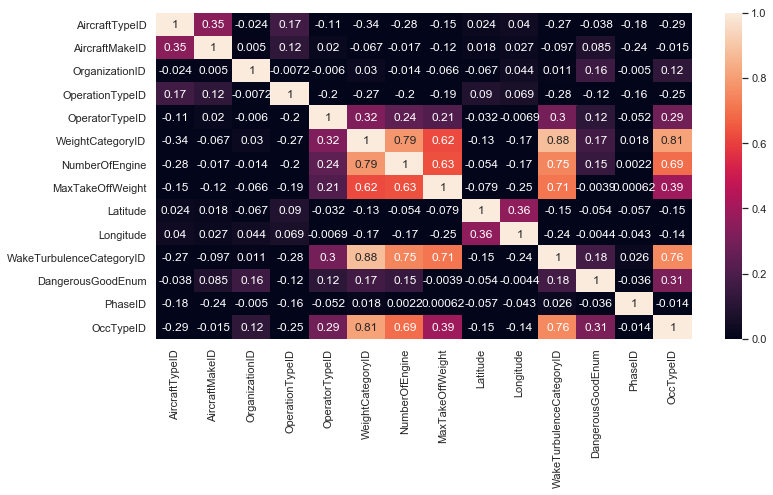

In [159]:
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.heatmap(df.corr(), annot=True, ax = ax, vmin = 0, vmax = 1)

#### Checking for duplicates

In [160]:
df.duplicated(subset=None, keep="first").sum()
#found two duplicates
df.shape

(43814, 15)

In [161]:
col=df.columns
df=df.drop_duplicates(col, keep="first")
df.shape
#Removed the duplicates

(43745, 15)

#### Find nulls and remove it

In [162]:
df.isnull().sum().sum()
#gives total number of np.nan in the dataframe

24931

In [163]:
df=df.dropna()
#dropped the nulls and update the dataframe
df.shape

(27665, 15)

#### Splitting the dataframe in: (feature,target)

In [164]:
x=df[features]
y=df[target]

In [165]:
# Making the target as category
y=y.astype("category")

# TypeCasting the features which are required for our model
x.AircraftTypeID=x.AircraftTypeID.astype("int64")
#x.OccTime=x.OccTime.astype("int64")
x.dtypes

AircraftTypeID                int64
AircraftMakeID              float64
OrganizationID              float64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                      object
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

In [166]:
from sklearn.preprocessing import LabelEncoder

label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])
x["AircraftTypeID"]=label_encoder.fit_transform(x["AircraftTypeID"])
x["OccTime"]=label_encoder.fit_transform(x["OccTime"])

In [167]:
#Checking if features need some more work or not?
x.head(2)
#x.dtypes

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID
181463,2,53063.0,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0
181461,0,50371.0,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0


In [168]:
x.dtypes

AircraftTypeID                int64
AircraftMakeID              float64
OrganizationID                int64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                       int32
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

In [169]:
#Explore number of aircraft makers

len(x.AircraftMakeID.unique())

238

In [170]:
len(x.AircraftMakeID)

27665

In [171]:
print(x.AircraftMakeID.unique())

[53063. 50371. 50669. 50443. 50543. 50510. 56219. 50294. 50437. 50287.
 50374. 57203. 56962. 57025. 56137. 56213. 54467. 50656. 50295. 50522.
 58192. 56605. 56169. 58191. 56132. 56761. 50504. 50158. 56772. 50308.
 50706. 54377. 50414. 50409. 56340. 56439. 56915. 50466. 50559. 58199.
 50672. 50343. 50479. 56140. 56910. 50515. 50467. 50668. 50355. 50241.
 57152. 56233. 50246. 54041. 50236. 50233. 57125. 50395. 50239. 50254.
 54252. 50253. 50242. 50259. 56463. 50260. 50261. 50105. 50274. 50017.
 53962. 50769. 53388. 56249. 50532. 50570. 56492. 56138. 53919. 50023.
 50620. 56617. 58229. 50033. 53335. 50737. 56009. 56430. 56368. 54453.
 50195. 56868. 50003. 54057. 50629. 50702. 50541. 50566. 58203. 54362.
 50447. 54157. 50707. 56151. 50666. 54867. 56565. 54601. 54984. 50697.
 53500. 55156. 56711. 50746. 56884. 54003. 55506. 50557. 55580. 50157.
 55600. 55631. 54729. 55676. 55623. 50581. 50751. 55077. 50740. 56267.
 55921. 58227. 54450. 50391. 54172. 56002. 50304. 56063. 56245. 54455.
 55907

In [172]:
#Find the ratio (accidents / accidents + incidents) per maker, where 1 would be 
#accidents with no reports of incidents

x["AircraftMakeID"]=label_encoder.fit_transform(x["AircraftMakeID"])
_y=y.iloc[:,0].values
clock={}
CLOCK={}
for i, v in enumerate(x["AircraftMakeID"]):
    
    if _y[i]==3:
        if v not in clock.keys():
            clock[v]=1
        elif v in clock.keys():
            clock[v]=clock[v]+1
        else:
            print("weird")
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1
    else:
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1

            
        #print(v, _y[i])

In [173]:
len(clock)#Number of Accidents

95

In [174]:
len(CLOCK)# Number of accidents plus number of incidents

238

In [175]:
final=[]
for key, value in CLOCK.items():
    if key in clock:
        ratio=clock[key]/CLOCK[key]
        temp=(key, ratio)
        final.append(temp)
    else:
        temp=(key, 0)
        final.append(temp)

In [176]:
final[0]
#clock[79] , CLOCK[79]

(77, 0)

In [177]:
_y=y.iloc[:,0].values
_y.shape
y.head()

,OccTypeID
181463,1
181461,1
181460,1
181455,1
181453,1


### Classification using RFC

In [178]:
x.dtypes

AircraftTypeID                int64
AircraftMakeID                int64
OrganizationID                int64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                       int32
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

# 
OccID : unique ID
AircraftTypeID : 
AircraftMakeID : 
OrganizationID : 
OperationTypeID : 
OperatorTypeID : 
WeightCategoryID : 
YearOfManuf : 
NumberOfEngine : 
MaxTakeOffWeight : 
NumberOfEngine : 
OccDate : 
OccTime : 
Latitude : 
Longitude : 
DamageLevelID : 
WakeTurbulenceCategoryID : 
DangerousGoodEnum : 
PhaseID : 
TotalFatalCount : 


In [179]:
x.OrganizationID=x.OrganizationID.astype("int64")

In [180]:
from sklearn.preprocessing import LabelEncoder
label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])

In [181]:
x.OrganizationID

181463     775
181461     272
181460     314
181455     272
181453     272
181446    1496
181438     789
181434     272
181429     272
181427      69
181424     312
181423     115
181421     482
181419     723
181413    1049
181406    1072
181405    1079
181401      69
181395    1496
181394     322
181391    1009
181380     316
181378     357
181377     276
181374     968
181371    1095
181369     828
181368    1152
181367    1023
181366     776
          ... 
190       2863
189       2516
184       2585
183        863
174       3318
173       3318
171       2971
161       2803
160       3413
150       3415
149       3024
145        109
139       3178
137        756
123       1642
120        756
116       2971
106       3318
57         756
52        3028
29         756
26        3500
19        2971
18        2720
16        2693
15        3501
14        2516
11        3209
1         1165
0         2736
Name: OrganizationID, Length: 27665, dtype: int64

In [182]:
#import libraries

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [183]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=6)

In [184]:
model = RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0).fit(x_train, y_train)

In [185]:
y_pred = model.predict(x_test)
print(y_pred)

[1 3 3 ... 3 1 1]


In [186]:
y_test

,OccTypeID
175194,1
15747,3
29125,3
54156,3
112431,3
68079,3
89001,1
105725,3
73585,1
176883,1


In [187]:
print ("The model score test is ", model.score(x_test, y_test)) 

The model score test is  0.9501174769564431


### K-means Clustering

In [188]:
from sklearn import neighbors
from sklearn.cluster import KMeans

In [189]:
X_=x
sum_square = {}

for k in range(1, 20):
    kmeans_aviation = KMeans(n_clusters = k).fit(X_)
    sum_square[k] = kmeans_aviation.inertia_
print(X_.shape)
print(X_.columns)
print(X_.head)

(27665, 14)
Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID'],
      dtype='object')
<bound method NDFrame.head of         AircraftTypeID  AircraftMakeID  OrganizationID  OperationTypeID  \
181463               2              77             775              9.0   
181461               0              30             272              1.0   
181460               0              63             314              3.0   
181455               0              37             272              1.0   
181453               0              37             272              1.0   
181446               0              52            1496             11.0   
181438               0              44             789             12.0   
181434               0              37             272        

In [190]:
X_.head()

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0


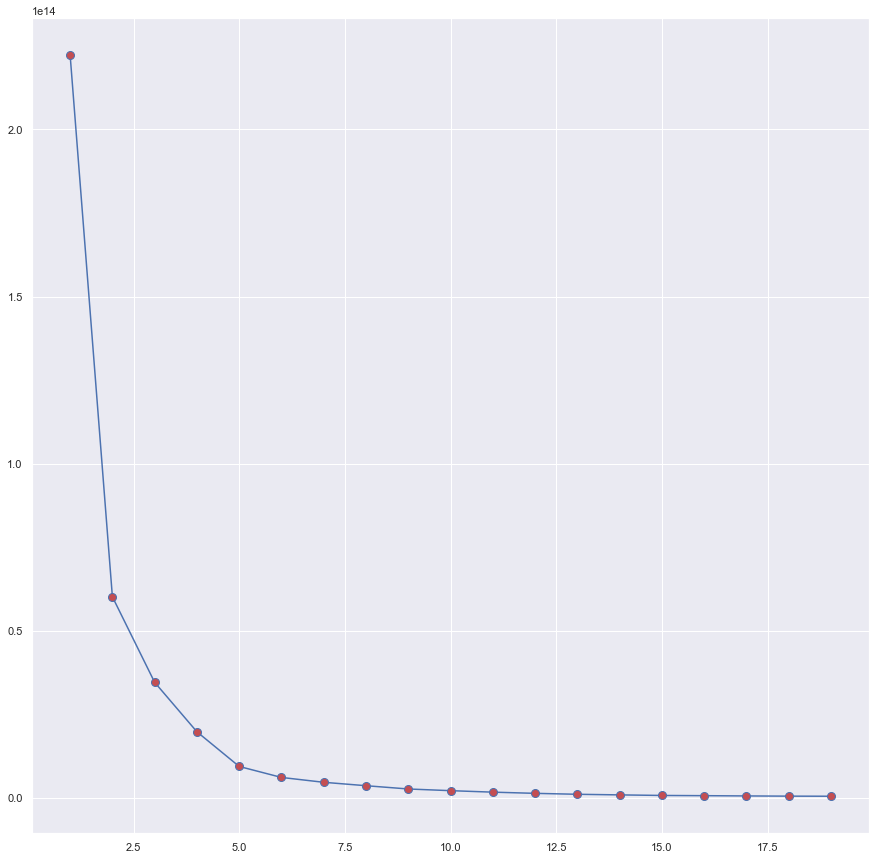

In [213]:
#Elbow method for k-means centers selection

plt.plot(list(sum_square.keys()), list(sum_square.values()),
         linestyle ='-', marker = 'o', color = 'b',
         markersize = 8,markerfacecolor = 'r')

#### Clustering with 5 centers

In [192]:
kmeans_5 = KMeans(n_clusters=5, random_state=0).fit(X_)
print('Cluster model K=5 inertia score is: ', kmeans_5.inertia_)
y=kmeans_5.predict(X_)

Cluster model K=5 inertia score is:  9442019253099.459


In [193]:
centers5 = kmeans_5.cluster_centers_
centers5

array([[ 3.70484804e-01,  7.26679962e+01,  1.57229746e+03,
         3.96584462e+00,  4.79164092e+00,  2.33559912e+00,
         1.62030223e+00,  9.89070299e+03,  5.00653608e+01,
         9.41849648e+01,  8.07585136e+02,  1.46210887e+00,
         2.53148700e+00,  1.83287006e+02],
       [ 7.54951657e-15,  4.94154930e+01,  1.36783223e+03,
         1.16570008e+00,  4.96313173e+00,  4.04929577e+00,
         2.38235294e+00,  2.02125922e+05,  4.68516951e+01,
         7.50748191e+01,  7.68048467e+02,  2.99875725e+00,
         2.66487158e+00,  1.89386495e+02],
       [ 3.21964677e-15,  3.43187430e+01,  1.08534792e+03,
         1.21773288e+00,  4.95622896e+00,  5.00000000e+00,
         3.35353535e+00,  3.55193639e+05,  4.88487670e+01,
         7.59115510e+01,  7.62613917e+02,  3.00000000e+00,
         2.53086420e+00,  1.88261504e+02],
       [ 6.19962802e-04,  6.01898636e+01,  1.71748140e+03,
         1.36500310e+00,  4.95474272e+00,  4.00000000e+00,
         2.21171730e+00,  6.59763625e+04,  4.

In [194]:
X_['klabels_5'] = kmeans_5.labels_

In [195]:
df.columns

Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID',
       'OccTypeID'],
      dtype='object')

In [196]:
X_.head()
#X_.shape

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,klabels_5
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0,0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0,0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0,0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0,0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0,0


In [197]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [198]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_5.labels_))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.02      0.00      0.01      8427
           2       0.00      0.00      0.00         0
           3       0.98      0.33      0.49     19238
           4       0.00      0.00      0.00         0

    accuracy                           0.23     27665
   macro avg       0.20      0.07      0.10     27665
weighted avg       0.69      0.23      0.35     27665



In [199]:
X_.klabels_5.value_counts()

0    17801
3     6452
1     2414
2      891
4      107
Name: klabels_5, dtype: int64

In [200]:
df.OccTypeID.value_counts()

3    19238
1     8427
Name: OccTypeID, dtype: int64

#### Clustering with 4 centers

In [201]:
kmeans_4 = KMeans(n_clusters=4, random_state=0).fit(X_)
print('Cluster model K=4 inertia score is: ', kmeans_4.inertia_)
y=kmeans_4.predict(X_)

Cluster model K=4 inertia score is:  19810963953810.234


In [202]:
centers4 = kmeans_4.cluster_centers_
centers4

array([[ 3.70484804e-01,  7.26679962e+01,  1.57229746e+03,
         3.96584462e+00,  4.79164092e+00,  2.33559912e+00,
         1.62030223e+00,  9.89070299e+03,  5.00653608e+01,
         9.41849648e+01,  8.07585136e+02,  1.46210887e+00,
         2.53148700e+00,  1.83287006e+02, -3.31068506e-13],
       [ 7.63278329e-15,  4.86735669e+01,  1.36529857e+03,
         1.16401274e+00,  4.96178344e+00,  4.08757962e+00,
         2.38335987e+00,  2.05702898e+05,  4.69173174e+01,
         7.50907925e+01,  7.65103105e+02,  3.00000000e+00,
         2.66480892e+00,  1.89288615e+02,  1.04020701e+00],
       [ 3.24740235e-15,  3.58472687e+01,  1.06626198e+03,
         1.25863991e+00,  4.96544036e+00,  5.00000000e+00,
         3.50613155e+00,  4.02761817e+05,  4.87560187e+01,
         7.58459676e+01,  7.73781494e+02,  3.00000000e+00,
         2.46711260e+00,  1.88508361e+02,  2.23857302e+00],
       [ 6.19674671e-04,  6.01730442e+01,  1.71785252e+03,
         1.36483346e+00,  4.95476375e+00,  4.00000000

In [203]:
X_['klabels_4'] = kmeans_4.labels_

In [204]:
df.columns

Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID',
       'OccTypeID'],
      dtype='object')

In [205]:
X_.head()
#X_.shape

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,klabels_5,klabels_4
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0,0,0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0,0,0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0,0,0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0,0,0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0,0,0


In [206]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [207]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_4.labels_))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.02      0.01      0.01      8427
           2       0.00      0.00      0.00         0
           3       0.98      0.33      0.49     19238

    accuracy                           0.23     27665
   macro avg       0.25      0.08      0.13     27665
weighted avg       0.69      0.23      0.35     27665



In [208]:
print(confusion_matrix(df['OccTypeID'], kmeans_4.labels_))

[[   0    0    0    0]
 [8236   43   34  114]
 [   0    0    0    0]
 [9565 2469  863 6341]]


In [209]:
from sklearn.metrics import accuracy_score
accuracy_score(df.OccTypeID, kmeans_4.labels_)

0.2307608892101934

In [210]:
X_.klabels_4.value_counts()

0    17801
3     6455
1     2512
2      897
Name: klabels_4, dtype: int64

In [211]:
df.OccTypeID.value_counts()

3    19238
1     8427
Name: OccTypeID, dtype: int64

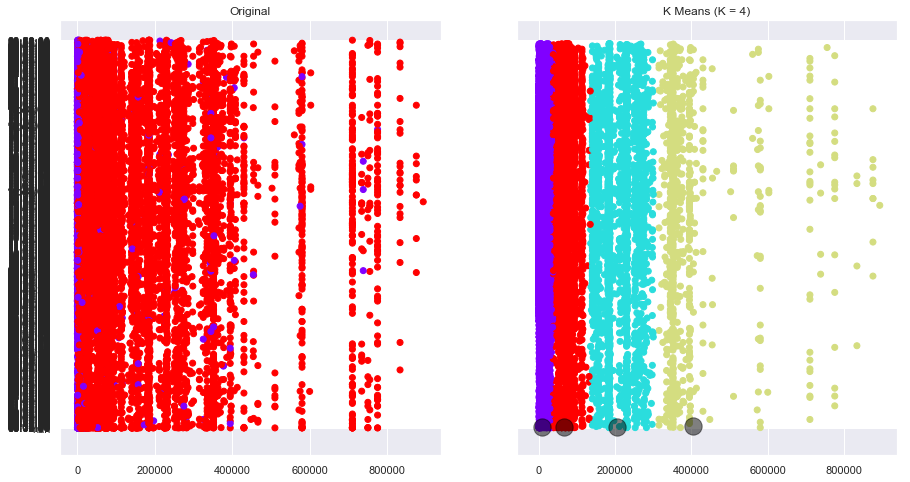

In [212]:
f, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2,
                             sharey = True, figsize = (15,8))

# For original data 
ax1.set_title("Original")
ax1.scatter(x = dfm['MaxTakeOffWeight'], y = dfm['OccTime'], 
            c = dfm['OccTypeID'], cmap='rainbow')


# For fitted with kmeans 
ax2.set_title('K Means (K = 4)')
ax2.scatter(x = X_['MaxTakeOffWeight'], y = X_['OccTime'], 
            c = X_['klabels_4'], cmap='rainbow')
ax2.scatter(x=centers4[:, 7], y=centers4[:, 5],
            c='black',s=300, alpha=0.5);



### 5. Interpreting Data

It is clear than a long conversation with TSB would solve questions related to features and general caractheristics of the data. Data exploration shows an interesting distribution of occurrences by location, aircraft maker, phase of flight, type of operator and fatalities. 

The modeled Classification using the Random Forest algorithm shows a decent accuracy to predict an occurrence based on:

<p>- type and aircraft maker, organization, operation and operator type <br />- aircraft features as weight, number of engines, wake turbulence and dangerous goods transported<br />- phase of flight, time of occurrence and location</p>

K-means clustering using the same information was ineffective in predicting occurrences and was used as a reference. 

Further work would bring insight regarding the geographical areas with more occurrences, ratio of occurrences and aircraft movements, occurrences per type of operator and phase of flight and probably, the 'sky is the limit' in all other permutations! 